# Coursework 2: Generative Models

## Instructions

### Submission 
Please submit one zip file on cate - *CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells**
2. Your trained VAE model as *VAE_model.pth*
3. Your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*


### Training
Training the GAN will take quite a long time (multiple hours), please refer to the 4 GPU options detailed in the logistics lecture. Some additional useful pointers:
* PaperSpace [guide if you need more compute](https://hackmd.io/@afspies/S1stL8Qnt)
* Lab GPUs via SSH.  The VSCode Remote Develop extension is recommended for this. For general Imperial remote working instructions see [this post](https://www.doc.ic.ac.uk/~nuric/teaching/remote-working-for-imperial-computing-students.html). You'll also want to [setup your environment as outlined here](https://hackmd.io/@afspies/Bkd7Zq60K).
* Use Colab and add checkpointing to the model training code; this is to handle the case where colab stops a free-GPU kernel after a certain number of hours (~4).
* Use Colab Pro - If you do not wish to use PaperSpace then you can pay for Colab Pro. We cannot pay for this on your behalf (this is Google's fault).


### Testing
TAs will run a testing cell (at the end of this notebook), so you are required to copy your data ```transform``` and ```denorm``` functions to a cell near the bottom of the document (it is demarkated). You are advised to check that your implementations pass these tests (in particular, the jit saving and loading may not work for certain niche functions)

### General
You can feel free to add architectural alterations / custom functions outside of pre-defined code blocks, but if you manipulate the model's inputs in some way, please include the same code in the TA test cell, so our tests will run easily.

<font color="orange">**The deadline for submission is Monday, 26 Feb by 6 pm** </font>

## Setting up working environment
You will need to install pytorch and import some utilities by running the following cell:

In [1]:
!pip3 install -q torch torchvision altair==4.2.2 seaborn tqdm torchsummary
# !git clone -q https://github.com/afspies/icl_dl_cw2_utils

In [2]:
from icl_dl_cw2_utils.utils.plotting import plot_tsne
from pathlib import Path
import tqdm
from torchsummary import summary

Here we have some default pathing options which vary depending on the environment you are using. You can of course change these as you please.

In [3]:
# Initialization Cell
WORKING_ENV = 'LOCAL' # Can be LABS, COLAB, PAPERSPACE, SAGEMAKER
USERNAME = '' # If working on Lab Machines - Your college username
assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE', 'SAGEMAKER', 'LOCAL']

if WORKING_ENV == 'COLAB':
    from google.colab import drive
    %load_ext google.colab.data_table
    dl_cw2_repo_path = 'dl_cw2/' # path in your gdrive to the repo
    content_path = f'/content/drive/MyDrive/{dl_cw2_repo_path}' # path to gitrepo in gdrive after mounting
    data_path = './data/' # save the data locally
    drive.mount('/content/drive/') # Outputs will be saved in your google drive

elif WORKING_ENV == 'LABS':
    content_path = f'/vol/bitbucket/{USERNAME}/dl/dl_cw2/' # You may want to change this
    data_path = f'/vol/bitbucket/{USERNAME}/dl/'
    # Your python env and training data should be on bitbucket
    if 'vol/bitbucket' not in content_path or 'vol/bitbucket' not in data_path:
        import warnings
        warnings.warn(
           'It is best to create a dir in /vol/bitbucket/ otherwise you will quickly run into memory issues'
           )
elif WORKING_ENV == 'PAPERSPACE': # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets
    content_path = '/notebooks/'
    data_path = './data/'

elif WORKING_ENV == 'SAGEMAKER':
    content_path = '/home/studio-lab-user/sagemaker-studiolab-notebooks/dl/'
    data_path = f'{content_path}data/'

elif WORKING_ENV == 'LOCAL':
    content_path = './'
    data_path = './data/'
else:
  raise NotImplementedError()

content_path = Path(content_path)

## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. More marks are awarded for using a Convolutional Encoder and Decoder.

b. Design an appropriate loss function and train the model.


### Setup

In [4]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_VAE/'):
    os.makedirs(content_path/'CW_VAE/')

if not os.path.exists(data_path):
    os.makedirs(data_path)

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


In [8]:
# Initialization Cell
WORKING_ENV = 'LOCAL' # Can be LABS, COLAB, PAPERSPACE, SAGEMAKER
USERNAME = '' # If working on Lab Machines - Your college username
assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE', 'SAGEMAKER', 'LOCAL']

if WORKING_ENV == 'COLAB':
    from google.colab import drive
    %load_ext google.colab.data_table
    dl_cw2_repo_path = 'dl_cw2/' # path in your gdrive to the repo
    content_path = f'/content/drive/MyDrive/{dl_cw2_repo_path}' # path to gitrepo in gdrive after mounting
    data_path = './data/' # save the data locally
    drive.mount('/content/drive/') # Outputs will be saved in your google drive

elif WORKING_ENV == 'LABS':
    content_path = f'/vol/bitbucket/{USERNAME}/dl/dl_cw2/' # You may want to change this
    data_path = f'/vol/bitbucket/{USERNAME}/dl/'
    # Your python env and training data should be on bitbucket
    if 'vol/bitbucket' not in content_path or 'vol/bitbucket' not in data_path:
        import warnings
        warnings.warn(
           'It is best to create a dir in /vol/bitbucket/ otherwise you will quickly run into memory issues'
           )
elif WORKING_ENV == 'PAPERSPACE': # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets
    content_path = '/notebooks/'
    data_path = './data/'

elif WORKING_ENV == 'SAGEMAKER':
    content_path = '/home/studio-lab-user/sagemaker-studiolab-notebooks/dl/'
    data_path = f'{content_path}data/'

elif WORKING_ENV == 'LOCAL':
    content_path = './'
    data_path = './data/'
else:
  raise NotImplementedError()

content_path = Path(content_path)

---
## Part 1.1a: Implement VAE (25 Points)

### Hyper-parameter selection

In [5]:
# Necessary Hyperparameters
num_epochs = 30
learning_rate = 10e-4
batch_size = 128
latent_dim = 32
# beta =
# Additional Hyperparameters


# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [6]:
train_dat = datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
val_dat = datasets.MNIST(data_path, train=False, transform=transform)

total_size = len(train_dat)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_val = DataLoader(val_dat, batch_size, shuffle=False)

# Don't change
sample_inputs, _ = next(iter(loader_val))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, content_path/'CW_VAE/image_original.png')

### Model Definition


<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [7]:
# CODE FOR PART 1.1a IN THIS CELL

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       * START OF YOUR CODE *
        #######################################################################

        self.in_channel = 1
        self.out_channel = 32
        self.encoded_image_dim = 16

        cnn_layers = [
            self.in_channel,
            self.out_channel,     # 28x28 -> 24x24
            self.out_channel*2,   # 24x24 -> 20x20
            self.out_channel*3,   # 20x20 -> 16x16
            # self.out_channel*4, # 16x16 -> 12x12
        ]

        ll_size = 256

        self.last_layer_size = cnn_layers[-1]

        modules = []

        for input, output in zip(cnn_layers, cnn_layers[1:]):
            modules.append(
                nn.Sequential(
                    nn.Conv2d(input, output, kernel_size=5, stride=1, padding=0),
                    nn.BatchNorm2d(output),
                    nn.LeakyReLU()
                )
            )

        modules.append(nn.Sequential(
            nn.Flatten(),
            nn.Linear(self.last_layer_size * self.encoded_image_dim ** 2, ll_size),
            nn.BatchNorm1d(ll_size),
            nn.LeakyReLU(),
        ))
         # CNN for the encoder
        self.encoder = nn.Sequential(*modules)

        modules = []
        rev_cnn_layers = cnn_layers[::-1][:-1]
        for input, output in zip(rev_cnn_layers, rev_cnn_layers[1:]):
            modules.append(
                nn.Sequential(
                    nn.ConvTranspose2d(input, output, kernel_size=5, stride=1, padding=0),
                    nn.BatchNorm2d(output),
                    nn.LeakyReLU()
                )
            )

        modules.append(nn.Sequential( # Last layer
            nn.ConvTranspose2d(cnn_layers[1], self.in_channel, kernel_size=5, stride=1, padding=0),
            nn.Sigmoid(),
        ))

        self.decoder = nn.Sequential(*modules)

        # To go from original space (after CNN) into latent space for both the mean and the variance
        self.mean_layer = nn.Linear(ll_size, latent_dim)  # Adjusted based on the last convolutional layer's output dimensions
        self.logvar_layer = nn.Linear(ll_size, latent_dim)  # Adjusted based on the last convolutional layer's output dimensions

         # To go from latent space into ending CNN space for the latent variable to go to the original space after decoder
        # self.z_transform = nn.Linear(latent_dim, self.last_layer_size * self.encoded_image_dim ** 2)   # Adjust the output size to match the expected input size of the first transpose convolutional layer in the decoder
        self.z_transform = nn.Sequential(
            nn.Linear(latent_dim, ll_size),
            nn.BatchNorm1d(ll_size),
            nn.LeakyReLU(),
            nn.Linear(ll_size, self.last_layer_size * self.encoded_image_dim ** 2),
        )
        #######################################################################
        #                       * END OF YOUR CODE *
        #######################################################################

    @torch.jit.export
    def encode(self, x):
        #######################################################################
        #                       * START OF YOUR CODE *
        #######################################################################

        x = self.encoder(x)
        x = x.view(x.shape[0], -1)  # Reshape instead of flattening
        mean = self.mean_layer(x)
        logvar = self.logvar_layer(x)
        return mean, logvar

        #######################################################################
        #                       * END OF YOUR CODE *
        #######################################################################

    @torch.jit.export
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       * START OF YOUR CODE *
        #######################################################################
        if not self.training:
            return mu

        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)

        return eps * std + mu
        #######################################################################
        #                       * END OF YOUR CODE *
        #######################################################################

    @torch.jit.export
    def decode(self, z):
        #######################################################################
        #                       * START OF YOUR CODE *
        #######################################################################
        z = self.z_transform(z)
        z = z.view(-1, self.last_layer_size, self.encoded_image_dim, self.encoded_image_dim)
        z = self.decoder(z)
        return z

        #######################################################################
        #                       * END OF YOUR CODE *
        #######################################################################

    def forward(self, x):
        #######################################################################
        #                       * START OF YOUR CODE *
        #######################################################################

        mean, logvar = self.encode(x)
        z = self.reparametrize(mean, logvar)
        x_hat = self.decode(z)
        return x_hat, mean, logvar

        #######################################################################
        #                       * END OF YOUR CODE *
        #######################################################################

# model = VAE(latent_dim).to(device)
model = VAE(latent_dim).to(device)
# params = sum(p.numel() for p in model.parameters() if p.requires_grad)
# print("Total number of parameters is: {}".format(params))
# print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

summary(model, (1, 28, 28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 24, 24]             832
       BatchNorm2d-2           [-1, 32, 24, 24]              64
         LeakyReLU-3           [-1, 32, 24, 24]               0
            Conv2d-4           [-1, 64, 20, 20]          51,264
       BatchNorm2d-5           [-1, 64, 20, 20]             128
         LeakyReLU-6           [-1, 64, 20, 20]               0
            Conv2d-7           [-1, 96, 16, 16]         153,696
       BatchNorm2d-8           [-1, 96, 16, 16]             192
         LeakyReLU-9           [-1, 96, 16, 16]               0
          Flatten-10                [-1, 24576]               0
           Linear-11                  [-1, 256]       6,291,712
      BatchNorm1d-12                  [-1, 256]             512
        LeakyReLU-13                  [-1, 256]               0
           Linear-14                   

--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss

Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [8]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta):
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    loss = nn.BCELoss(reduction='sum')
    recon_loss = loss(recon_x, x)
    kld_loss = -0.5 * (1 + logvar - mu.pow(2) - logvar.exp()).sum()

    weighted_kld_loss = beta * kld_loss

    return recon_loss + weighted_kld_loss, recon_loss, weighted_kld_loss
    #######################################################################
    #                       ** END OF YOUR CODE **
    #######################################################################

### Evaluation function

In [10]:
def evaluate(model, loader, beta, epochs=25):
    totals = []
    recons = []
    klds = []

    with torch.no_grad():
        model.eval()
        for batch_idx, (data, _) in enumerate(loader):
            if batch_idx == epochs:
                break
            data = data.view(-1, 1, 28, 28).to(device)
            x_hat, mu, logvar = model(data)

            loss, recon_loss, kld_loss = loss_function_VAE(x_hat, data, mu, logvar, beta)
            totals.append(loss.item() / len(data))
            recons.append(recon_loss / len(data))
            klds.append(kld_loss / len(data))

    model.train()
    return torch.tensor(totals).mean(), torch.tensor(recons).mean(), torch.tensor(klds).mean()

### `BetaSchedule` class

In [13]:
# Helper class for scheduling.
# Call step, every time beta needs to be cycled
# Overwrites multiplication to work as a scalar

class BetaSchedule:
    def __init__(self, schedule):
        self.schedule = schedule
        self.idx = 0
        self.plot_x = 16

    def step(self):
        self.idx += 1
        self.idx %= len(self.schedule)

    def plot_ax(self, ax):
        repeating = self.plot_x // len(self.schedule) + 1
        betas = (self.schedule * max(1, repeating))[:self.plot_x] # Repeat the schedule plot_x to make it easier to plot
        timesteps = list(range(self.plot_x))
        ax.plot(timesteps, betas, '-o', label='Beta value')  # Line plot with points
        ax.scatter(timesteps, betas, color='blue')  # Highlight points
        ax.set_title(f'beta={self}')
        ax.set_xlabel('Timestep')
        ax.set_ylabel('Beta')
        ax.grid(True)  # Add gridlines

        return ax

    def plot(self):
        fig, ax = plt.subplots(figsize=(8, 5))
        self.plot_ax(ax)
        plt.show()

    def __str__(self):
        return str(self.schedule) # Return entire schedule for saving and plotting purposes

    def __repr__(self):
        # This will control the output when you do f"{beta=}" or repr(beta)
        return str(self.schedule)

    def __mul__(self, other):
        return self.schedule[self.idx] * other

    def __rmul__(self, other):
        return self.__mul__(other)

### Plotting Utilities

In [15]:

def show_ax(img, ax):
    npimg = img.numpy()
    ax.imshow(np.transpose(npimg, (1, 2, 0)))
    ax.axis('off')


def plot_beta_schedules_ax(schedules, axs):
    for schedule, ax in zip(schedules, axs):
        schedule.plot_ax(ax)

def plot_losses_ax(axs, train_losses, val_losses, beta):
    # Plot training losses on the first subplot
    axs[0].plot(train_losses['total'], label='Total Loss', color='red')
    axs[0].plot(train_losses['recon_loss'], label='Reconstruction Loss', color='green')
    axs[0].plot(train_losses['kld_loss'], label='KLD Loss', color='blue')
    axs[0].set_title(f'Training Losses for beta={beta}')
    axs[0].grid(True)
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Loss')
    axs[0].legend()

    # Plot testing losses on the second subplot
    axs[1].plot(val_losses['total'], label='Total Loss', color='red')
    axs[1].plot(val_losses['recon_loss'], label='Reconstruction Loss', color='green')
    axs[1].plot(val_losses['kld_loss'], label='KLD Loss', color='blue')
    axs[1].set_title(f'Testing Losses for beta={beta}')
    axs[1].grid(True)
    axs[1].set_xlabel('Test Run')
    axs[1].set_ylabel('Loss')
    axs[1].legend()

def plot_reconstructions_ax(model, ax):
    prev_model_state = model.training
    model.eval()
    sample_inputs, _ = next(iter(loader_val))
    fixed_input = sample_inputs[0:32, :, :, :]
    ax.set_title('Reconstructed Images')
    with torch.no_grad():
        recon_batch = model(fixed_input.to(device))[0].cpu()
        recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                                value_range=None, scale_each=False, pad_value=0)
        show_ax(recon_batch, ax)

    model.train(prev_model_state)


def plot_generated_ax(model, ax):
    # Plotting randomly generated images on the second axis
    prev_model_state = model.training
    model.eval()
    z = torch.randn(256, latent_dim).to(device)
    with torch.no_grad():
        samples = model.decode(z).cpu()
        samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            value_range=None, scale_each=False, pad_value=0)
        show_ax(samples, ax)
        ax.set_title('Randomly Generated Images')
    model.train(prev_model_state)

### Train function

In [11]:
def train(model, optimizer, beta, epochs):
    model.train()
    train_losses = {'total': [], 'recon_loss': [], 'kld_loss': []}
    val_losses = {'total': [], 'recon_loss': [], 'kld_loss': []}


    for epoch in range(epochs):
        total_losses = []
        recon_losses = []
        kld_losses = []
            # <- You may wish to add logging info here
        with tqdm.tqdm(loader_train, unit="batch") as tepoch:
            for batch_idx, (data, _) in enumerate(tepoch):
                #######################################################################
                #                       ** START OF YOUR CODE **
                #######################################################################
                # data = None # Need at least one batch/random data with right shape -
                            # This is required to initialize to model properly below
                            # when we save the computational graph for testing (jit.save)
                data = data.view(-1, 1, 28, 28).to(device)
                x_hat, mu, logvar = model(data)

                loss, recon_loss, kld_loss = loss_function_VAE(x_hat, data, mu, logvar, beta)

                total_losses.append(loss.item() / len(data))
                recon_losses.append(recon_loss / len(data))
                kld_losses.append(kld_loss / len(data))

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                #######################################################################
                #                       ** END OF YOUR CODE **
                #######################################################################
                if batch_idx % 20 == 0:
                    tepoch.set_description(f"Epoch {epoch}")
                    tepoch.set_postfix(loss=loss.item()/len(data))

        if isinstance(beta, BetaSchedule):
            beta.step()

        train_losses['total'].append(torch.tensor(total_losses).mean())
        train_losses['recon_loss'].append(torch.tensor(recon_losses).mean())
        train_losses['kld_loss'].append(torch.tensor(kld_losses).mean())

        total_loss, recon_loss, kld_loss = evaluate(model, loader_val, beta)
        val_losses['total'].append(total_loss)
        val_losses['recon_loss'].append(recon_loss)
        val_losses['kld_loss'].append(kld_loss)

        # save the model
        if epoch == epochs - 1:
            with torch.no_grad():
                torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                               content_path/f'CW_VAE/VAE_model_{beta=}.pth')

    return train_losses, val_losses

## Method which trains for save_every epochs saves the model and yields the intermediate losses
def train_generator(model, optimizer, beta, epochs, save_every=5):
    model.train()
    train_losses = {'total': [], 'recon_loss': [], 'kld_loss': []}
    val_losses = {'total': [], 'recon_loss': [], 'kld_loss': []}

    for epoch in range(epochs):
        # <- You may wish to add logging info here
        with tqdm.tqdm(loader_train, unit="batch") as tepoch:
            for batch_idx, (data, _) in enumerate(tepoch):
                data = data.view(-1, 1, 28, 28).to(device)
                x_hat, mu, logvar = model(data)

                loss, _, _ = loss_function_VAE(x_hat, data, mu, logvar, beta)

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                if batch_idx % 20 == 0:
                    tepoch.set_description(f"Epoch {epoch}")
                    tepoch.set_postfix(loss=loss.item()/len(data))

        if isinstance(beta, BetaSchedule):
            beta.step()

        total_loss, recon_loss, kld_loss = evaluate(model, loader_val, beta)
        val_losses['total'].append(total_loss)
        val_losses['recon_loss'].append(recon_loss)
        val_losses['kld_loss'].append(kld_loss)

        total_loss, recon_loss, kld_loss = evaluate(model, loader_train, beta)
        train_losses['total'].append(total_loss)
        train_losses['recon_loss'].append(recon_loss)
        train_losses['kld_loss'].append(kld_loss)

        # save the model
        if (epoch+1) % save_every == 0 or epoch == epochs - 1:
            with torch.no_grad():
                torch.save(model, content_path/f'CW_VAE/VAE_model_epochs={epoch+1}.pth')
            yield train_losses, val_losses

### Training

Epoch 29: 100%|██████████| 469/469 [00:08<00:00, 54.06batch/s, loss=153]


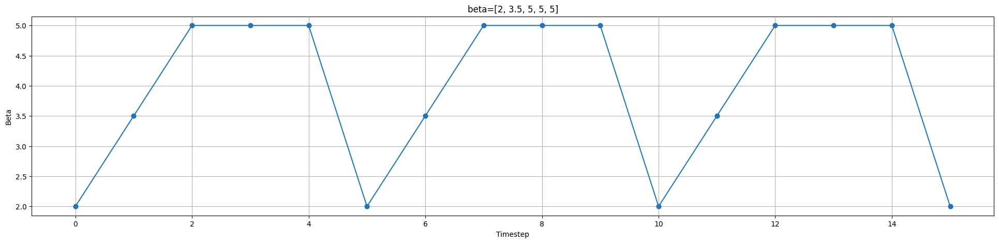

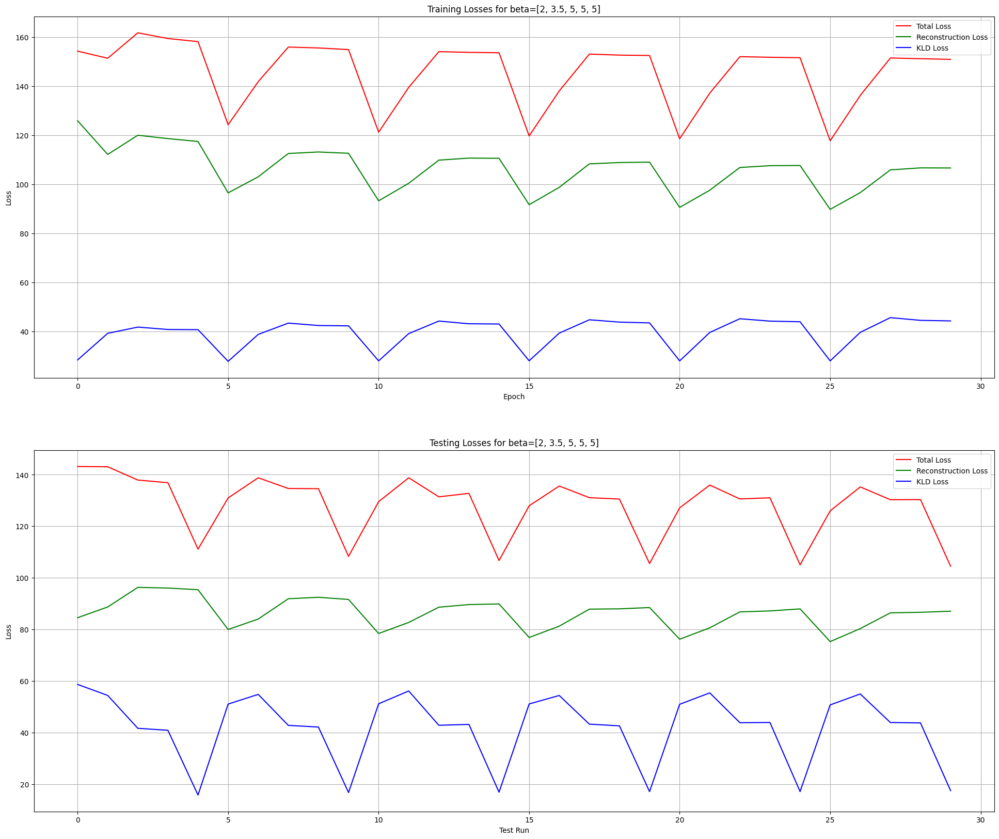

In [17]:
flagship_model = VAE(latent_dim).to(device)
optimizer = torch.optim.Adam(flagship_model.parameters(), lr=learning_rate)
beta = BetaSchedule([2, 3.5, 5, 5, 5])
train_losses, test_losses = train(flagship_model, optimizer, beta, num_epochs)

fig_beta, ax_beta = plt.subplots(1, 1, figsize=(24, 5))
fig_losses, axs_losses = plt.subplots(2, 1, figsize=(24, 20))

plot_losses_ax([axs_losses[0], axs_losses[1]], train_losses, test_losses, beta)
plot_beta_schedules_ax([beta], [ax_beta])

fig_beta.show()
fig_losses.show()

### Loss Explanation

Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space

  0%|          | 0/469 [00:00<?, ?batch/s]

100%|██████████| 469/469 [00:03<00:00, 129.40batch/s]


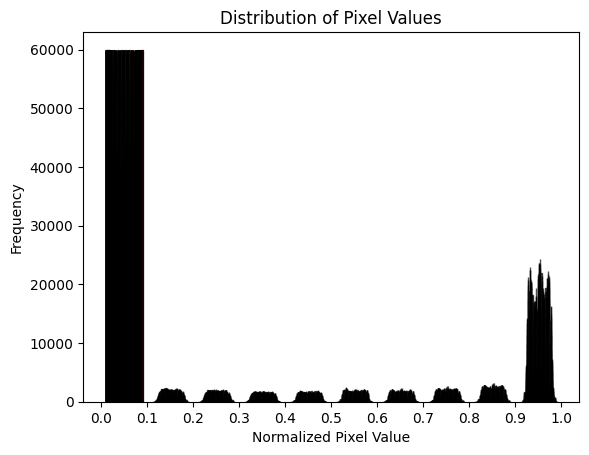

In [28]:
def plot_data_distribution(data_loader):
    # Initialize a list to hold the flattened pixel values
    pixel_values = []

    # Loop through the data_loader
    with tqdm.tqdm(data_loader, unit="batch") as tepoch:
        for batch_idx, (data, _) in enumerate(tepoch):
            # Flatten the data and append it to pixel_values
            # Assuming data is a PyTorch tensor with shape (batch_size, channels, height, width)
            pixel_values.append(data.view(data.size(0), -1))  # Flattens each image but keeps batch dimension

    # Concatenate all the flattened pixel values along the batch dimension
    pixel_values = torch.cat(pixel_values, dim=0).cpu()

    # Create bins for the histogram
    bins = np.arange(0, 1.1, 0.1)  # Using numpy to define bins for matplotlib

    # Plot the histogram
    plt.hist(pixel_values.numpy(), bins=bins, edgecolor='k', alpha=0.7)  # Convert to numpy array for plotting
    plt.xlabel('Normalized Pixel Value')
    plt.ylabel('Frequency')
    plt.title('Distribution of Pixel Values')
    plt.xticks(bins)
    plt.show()


plot_data_distribution(loader_train)

**YOUR ANSWER**

<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

### Scheduled $\beta$

Executing beta=[3, 4, 7, 7, 7]


Epoch 0:   1%|          | 4/469 [00:00<00:36, 12.77batch/s, loss=679]

Epoch 9: 100%|██████████| 469/469 [00:18<00:00, 25.45batch/s, loss=169]


Executing beta=[3, 4, 5, 10, 10, 10]


Epoch 9: 100%|██████████| 469/469 [00:18<00:00, 25.75batch/s, loss=177]


Executing beta=[2, 3.5, 5, 5, 5]


Epoch 9: 100%|██████████| 469/469 [00:18<00:00, 24.77batch/s, loss=161]


Executing beta=[3, 6, 12, 11, 10, 9]


Epoch 9: 100%|██████████| 469/469 [00:18<00:00, 25.66batch/s, loss=188]


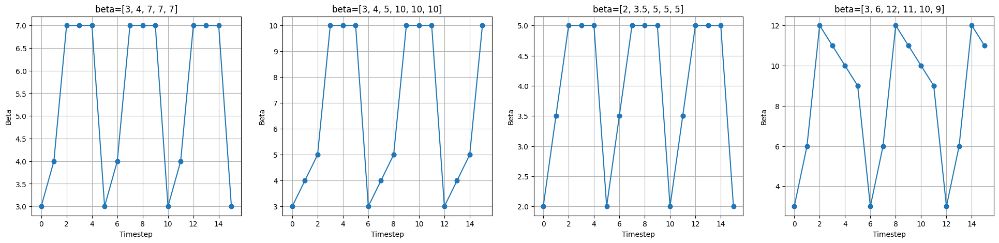

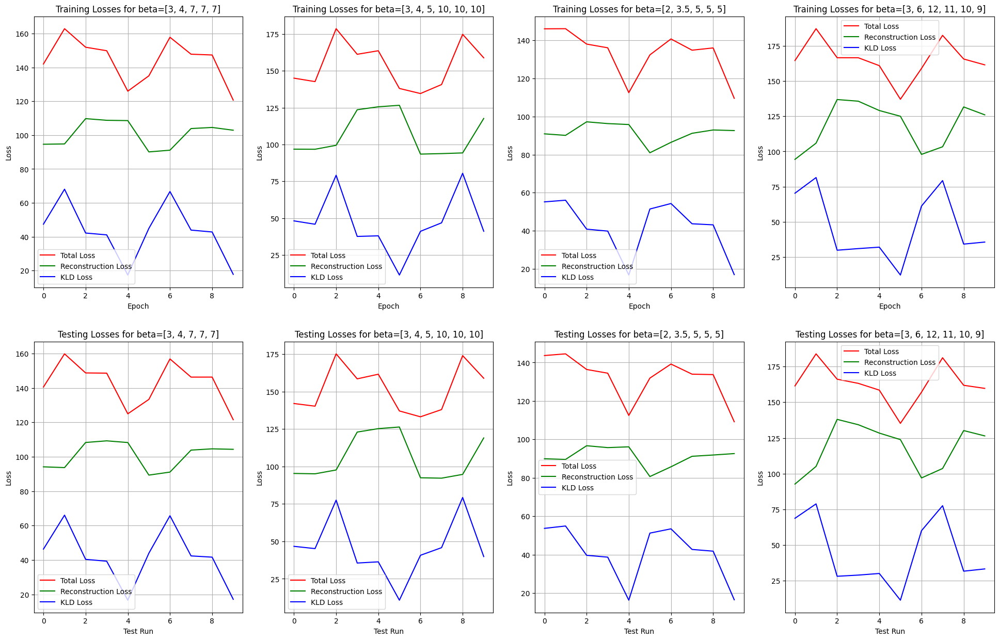

In [40]:
# *CODE FOR PART 1.2a IN THIS CELL*

beta_schedules = [
    BetaSchedule([3, 4, 7, 7, 7]),
    BetaSchedule([3, 4, 5, 10, 10, 10]),
    BetaSchedule([2, 3.5, 5, 5, 5]),
    BetaSchedule([3, 6, 12, 11, 10, 9]),
]

all_losses_train = []
all_losses_test = []

fig_beta, axs_beta = plt.subplots(1, len(beta_schedules), figsize=(24, 5))
fig_losses, axs_losses = plt.subplots(2, len(beta_schedules), figsize=(24, 15))

for idx, beta in enumerate(beta_schedules):
    print(f"Executing {beta=}")
    model = VAE(latent_dim).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    train_losses, test_losses = train(model, optimizer, beta, 10)
    all_losses_train.append((train_losses))
    all_losses_test.append((test_losses))
    plot_losses_ax([axs_losses[0][idx], axs_losses[1][idx]], train_losses, test_losses, beta)
    # plot_reconstructions(model)
plot_beta_schedules_ax(beta_schedules, axs_beta)

fig_beta.show()
fig_losses.show()

### Constant $\beta$

Executing beta=[3]


Epoch 9: 100%|██████████| 469/469 [00:18<00:00, 25.40batch/s, loss=134]


Executing beta=[5]


Epoch 9: 100%|██████████| 469/469 [00:18<00:00, 25.44batch/s, loss=155]


Executing beta=[10]


Epoch 9: 100%|██████████| 469/469 [00:18<00:00, 25.45batch/s, loss=184]


Executing beta=[20]


Epoch 9: 100%|██████████| 469/469 [00:18<00:00, 25.38batch/s, loss=215]


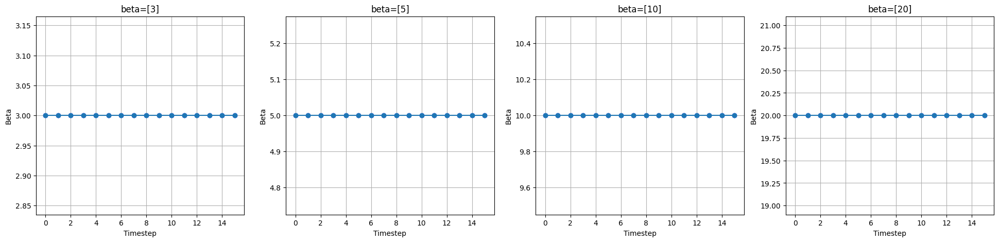

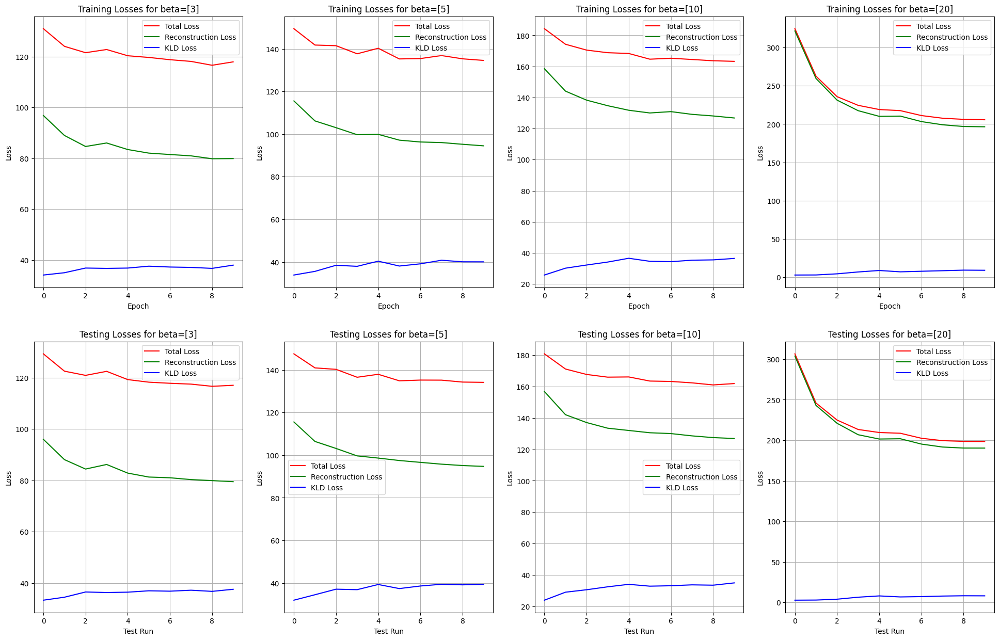

In [41]:
beta_schedules_const = [
    BetaSchedule([3]),
    BetaSchedule([5]),
    BetaSchedule([10]),
    BetaSchedule([20]),
]

all_losses_train = []
all_losses_test = []

fig_beta, axs_beta = plt.subplots(1, len(beta_schedules_const), figsize=(24, 5))
fig_losses, axs_losses = plt.subplots(2, len(beta_schedules_const), figsize=(24, 15))

for idx, beta in enumerate(beta_schedules_const):
    print(f"Executing {beta=}")
    model = VAE(latent_dim).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    train_losses, test_losses = train(model, optimizer, beta, 10)
    all_losses_train.append((train_losses))
    all_losses_test.append((test_losses))
    plot_losses_ax([axs_losses[0][idx], axs_losses[1][idx]], train_losses, test_losses, beta)
plot_beta_schedules_ax(beta_schedules_const, axs_beta)

fig_beta.show()
fig_losses.show()

## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

For reference, here's [some samples from our VAE](https://imgur.com/NwNMuG3).


### Reconstruction Plotting

In [30]:
# *CODE FOR PART 1.2b IN THIS CELL*

def plot_reconstructions(model):
    # load the model
    print('Input images')
    print('-'*50)

    sample_inputs, _ = next(iter(loader_val))
    fixed_input = sample_inputs[0:32, :, :, :]
    # visualize the original images of the last batch of the test set
    img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                    value_range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(img)

    model.eval()

    print('Reconstructed images')
    print('-'*50)
    with torch.no_grad():
        # visualize the reconstructed images of the last batch of test set

        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        recon_batch = model(fixed_input.to(device))[0]
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

        recon_batch = recon_batch.cpu()
        recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                                value_range=None, scale_each=False, pad_value=0)
        plt.figure()
        show(recon_batch)

    print('Generated Images')
    print('-'*50)
    model.eval()
    n_samples = 256
    z = torch.randn(n_samples,latent_dim).to(device)
    with torch.no_grad():
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        samples = model.decode(z)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

        samples = samples.cpu()
        samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                                value_range=None, scale_each=False, pad_value=0)
        plt.figure(figsize = (8,8))
        show(samples)
        plt.show()

### Load model

In [31]:
def load_model(path):
    model = torch.jit.load(path).to(device).eval()
    return model

In [32]:
flagship_model = load_model(content_path/'CW_VAE/VAE_model_beta=[2, 3.5, 5, 5, 5].pth')

Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


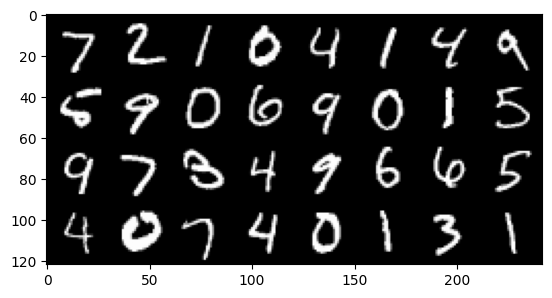

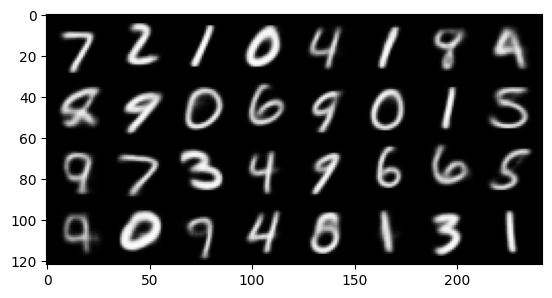

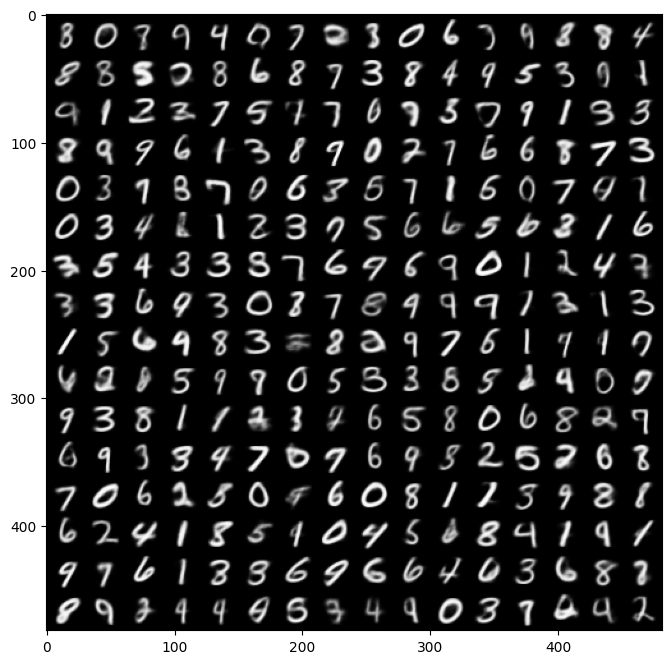

In [33]:
plot_reconstructions(flagship_model)

### Scheduled $\beta$

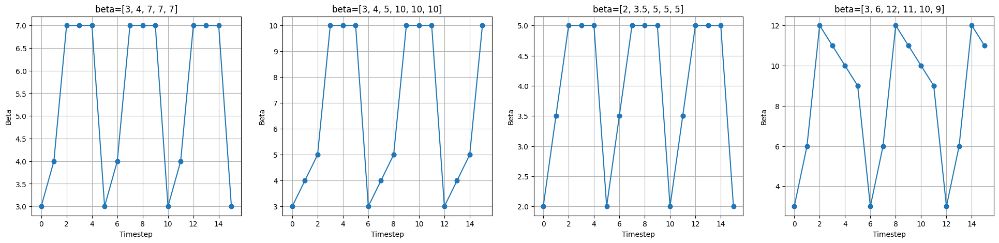

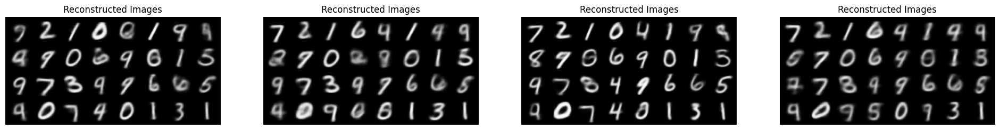

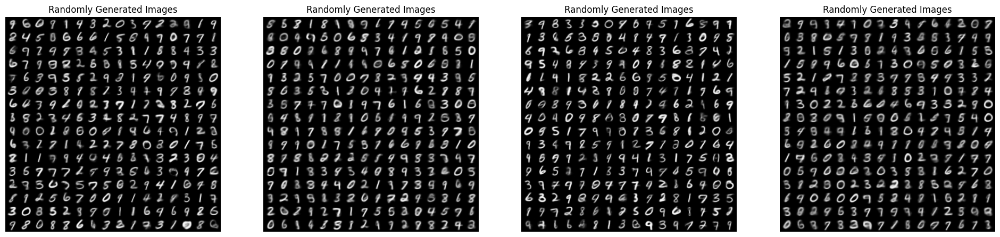

In [45]:
model_paths = [content_path/f'CW_VAE/VAE_model_{beta=}.pth' for beta in beta_schedules]

fig_beta, axs_beta = plt.subplots(1, len(beta_schedules), figsize=(24, 5))
fig_recon, axs_recon = plt.subplots(1, len(model_paths), figsize=(24, 5))
fig_gen, axs_gen = plt.subplots(1, len(beta_schedules), figsize=(24, 10))

for idx, path in enumerate(model_paths):
    model = load_model(path)
    plot_reconstructions_ax(model, axs_recon[idx])
    plot_generated_ax(model, axs_gen[idx])

plot_beta_schedules_ax(beta_schedules, axs_beta)
fig_beta.show()
fig_recon.show()
fig_gen.show()

### Constant $\beta$

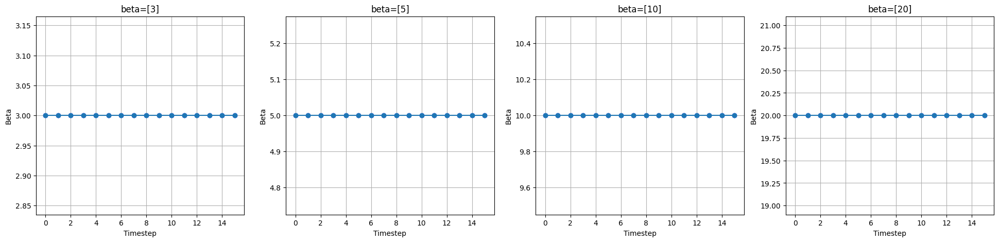

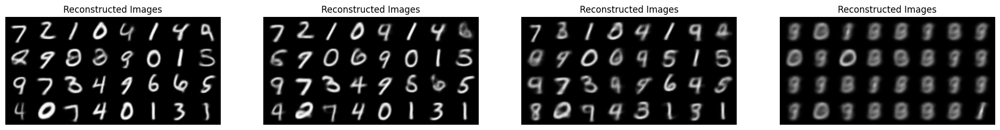

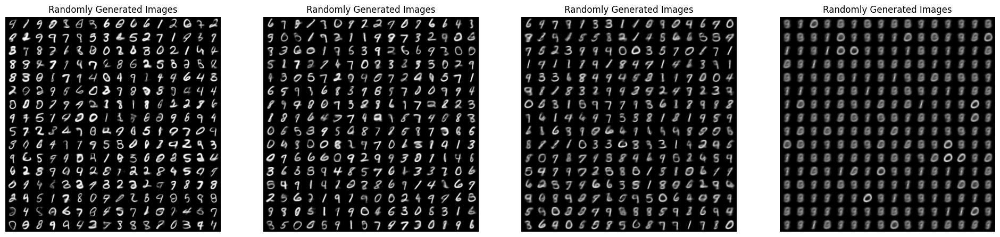

In [46]:
model_paths = [content_path/f'CW_VAE/VAE_model_{beta=}.pth' for beta in beta_schedules_const]

fig_beta, axs_beta = plt.subplots(1, len(beta_schedules_const), figsize=(24, 5))
fig_recon, axs_recon = plt.subplots(1, len(beta_schedules_const), figsize=(24, 5))
fig_gen, axs_gen = plt.subplots(1, len(beta_schedules_const), figsize=(24, 10))

for idx, path in enumerate(model_paths):
    model = load_model(path)
    plot_reconstructions_ax(model, axs_recon[idx])
    plot_generated_ax(model, axs_gen[idx])

plot_beta_schedules_ax(beta_schedules_const, axs_beta)
fig_beta.show()
fig_recon.show()
fig_gen.show()

### Mutli-stage $\beta$=[2, 3.5, 5, 5, 5]

Epoch 39: 100%|██████████| 469/469 [00:07<00:00, 60.04batch/s, loss=147]


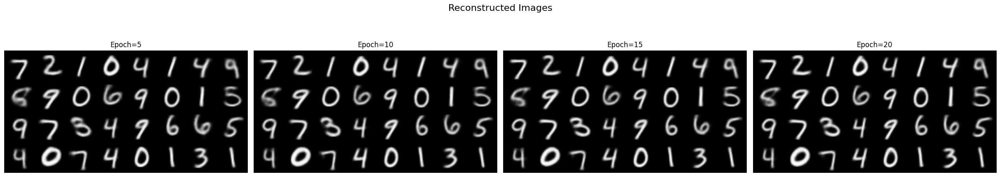

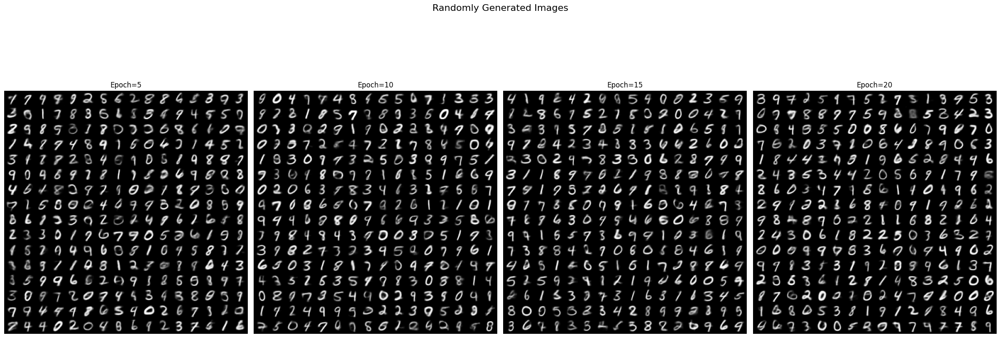

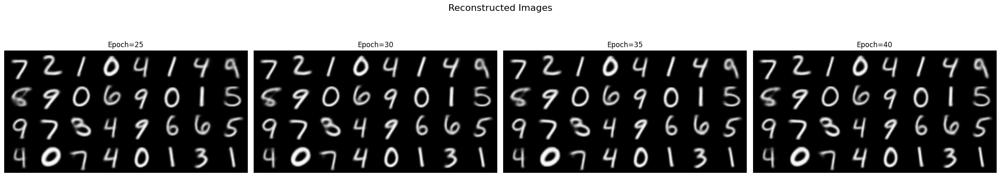

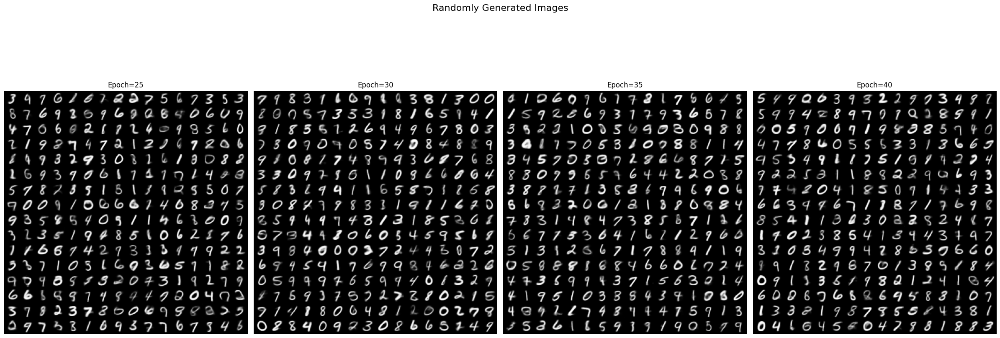

In [17]:
# Define model
multistage_model = VAE(latent_dim).to(device)
optimizer = torch.optim.Adam(multistage_model.parameters(), lr=learning_rate)
beta = BetaSchedule([2, 3.5, 5, 5, 5])

# Define plotting utilities
per_plot = 4

save_every = 5

fig_recon1, axs_recon1 = plt.subplots(1, per_plot, figsize=(24, 5))
fig_gen1, axs_gen1 = plt.subplots(1, per_plot, figsize=(24, 10))

fig_recon2, axs_recon2 = plt.subplots(1, per_plot, figsize=(24, 5))
fig_gen2, axs_gen2 = plt.subplots(1, per_plot, figsize=(24, 10))

axs_recons = [axs_recon1, axs_recon2]
axs_gens = [axs_gen1, axs_gen2]

# Train the model
for idx, (train_losses, test_losses) in enumerate(train_generator(multistage_model, optimizer, beta, 40, save_every)):
    plot_idx = idx // per_plot
    ax_idx = idx % per_plot

    axs_recon = axs_recons[plot_idx]
    axs_gen = axs_gens[plot_idx]

    plot_reconstructions_ax(multistage_model, axs_recon[ax_idx])
    plot_generated_ax(multistage_model, axs_gen[ax_idx])

    axs_recon[ax_idx].set_title(f"Epoch={(idx+1)*save_every}")
    axs_gen[ax_idx].set_title(f"Epoch={(idx+1)*save_every}")

# Plot results
fig_recon1.suptitle('Reconstructed Images', fontsize=16)
fig_recon2.suptitle('Reconstructed Images', fontsize=16)

fig_gen1.suptitle('Randomly Generated Images', fontsize=16)
fig_gen2.suptitle('Randomly Generated Images', fontsize=16)

fig_gen1.tight_layout()
fig_gen2.tight_layout()
fig_recon1.tight_layout()
fig_recon2.tight_layout()

fig_recon1.show()
fig_gen1.show()
fig_recon2.show()
fig_gen2.show()

### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? 
* What is posterior collapse and did you observe it during training (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**

---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). You can use a T-SNE implementation from a library such as scikit-learn. 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [18]:
def extract_z(model, loader):
    model.eval()
    zs = []
    labels = []
    with torch.no_grad():
        for (data, label) in loader:
            data = data.view(-1, 1, 28, 28).to(device)

            mu, logvar = model.encode(data)
            z = model.reparametrize(mu, logvar)
            zs.append(z)

            labels.append(label)

    return torch.cat(zs, dim=0).cpu(), torch.cat(labels, dim=0).cpu()

In [19]:
# *CODE FOR PART 1.3a IN THIS CELL
# Interactive Visualization - Code Provided
val_dataloader = DataLoader(val_dat, 10000, shuffle=False)


In [92]:
z, labels = extract_z(flagship_model, val_dataloader)

z_embedded = TSNE(n_components=2, init='pca', learning_rate='auto', perplexity=20).fit_transform(z)

plot_tsne(z_embedded, val_dataloader, num_points=1000, darkmode=False)


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


alt.HConcatChart(...)

In [ ]:
# Custom Visualizations

### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

Note - If you created multiple plots and want to include them in your discussion, the best option is to upload them to (e.g.) google drive and then embed them via a **public** share link. If you reference local files, please include these in your submission zip, and use relative pathing if you are embedding them (with the notebook in the base directory)

**YOUR ANSWER**

## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?

_hint: Locate the positions in latent space of 2 data points (maybe a one and an eight). Then sample multiple latent space vectors along the line which joins the 2 points and pass them through the decoder._


In [46]:
# CODE FOR PART 1.3b IN THIS CELL
def extract_digit_samples(data_loader, samples_per_digit=5, device='cpu'):
    # Initialize a dictionary to hold samples for each digit
    digit_samples = {digit: [] for digit in range(10)}

    # Track the number of samples collected for each digit
    samples_collected = {digit: 0 for digit in range(10)}

    # Loop through the DataLoader
    with torch.no_grad():
        for input_data, labels in data_loader:
            input_data = input_data.to(device)
            labels = labels.to(device)

            # Go through each digit we need samples for
            for digit in range(10):
                if samples_collected[digit] < samples_per_digit:
                    # Find all indices of the current digit in the batch
                    digit_indices = (labels == digit).nonzero(as_tuple=True)[0]

                    # Collect as many samples as possible for the current digit
                    for idx in digit_indices:
                        if samples_collected[digit] < samples_per_digit:
                            digit_samples[digit].append(input_data[idx])
                            samples_collected[digit] += 1

                        # Break if we've collected enough samples for this digit
                        if samples_collected[digit] == samples_per_digit:
                            break

            # Check if we have collected enough samples for all digits
            if all(count == samples_per_digit for count in samples_collected.values()):
                break

    # Convert lists to 2D arrays
    for digit in digit_samples:
        digit_samples[digit] = torch.stack(digit_samples[digit])

    return digit_samples

def create_inerpolation(model, start_digit_sample, end_digit_sample, steps):

    model.eval()

    # Proceed with your encoding and interpolation logic for the found samples
    with torch.no_grad():
        # Assuming you are using an autoencoder or similar model for encoding/decoding

        mu_start, logvar_start = model.encode(start_digit_sample)
        z_start = model.reparametrize(mu_start, logvar_start)

        mu_end, logvar_end = model.encode(end_digit_sample)
        z_end = model.reparametrize(mu_end, logvar_end)

        # Assuming you want to interpolate in the latent space between these two digits
        latent_start = z_start.flatten().cpu().detach().numpy()
        latent_end = z_end.flatten().cpu().detach().numpy()

        sampled_vectors = np.linspace(start=latent_start, stop=latent_end, num=steps)
        sampled_vectors = torch.tensor(sampled_vectors, device=device)
        generated_numbers = model.decode(sampled_vectors).cpu()

    generated_images = make_grid(denorm(generated_numbers), nrow=10, padding=5, normalize=False,
                                range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    plt.title(f'Linear interpolation')
    show(generated_images)
    plt.show()



torch.Size([1, 1, 28, 28])


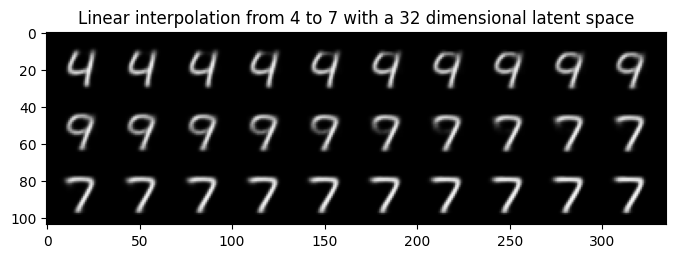

In [94]:
samples = extract_digit_samples(val_dataloader, samples_per_digit=5, device=device)

print(samples[4][0].unsqueeze(0).shape)

start_digit = 4
end_digit = 7

idx_start = 0
idx_end = 0

start_sample = samples[start_digit][idx_start].unsqueeze(0).to(device)
end_sample = samples[end_digit][idx_end].unsqueeze(0).to(device)

create_inerpolation(flagship_model, start_sample, end_sample, 30)

### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**YOUR ANSWER**

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures and tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to load and run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [4]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x, channels=None, w=None ,h=None, resize = False):

    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_GAN'):
    os.makedirs(content_path/'CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cpu


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small kernels, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [5]:
batch_size = 128 # change that

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=mean, std=std),
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=False, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=False, transform=transform)

loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

We'll visualize a subset of the test set: 

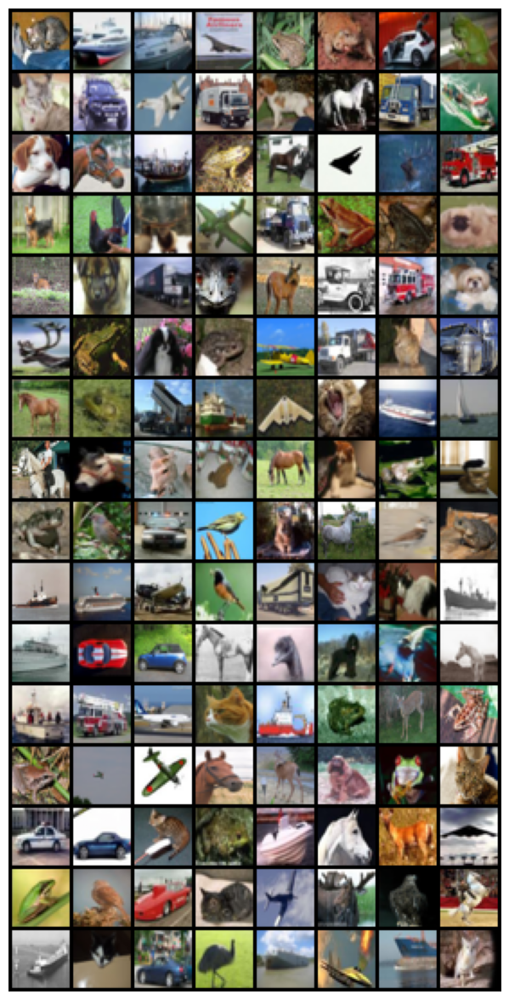

In [6]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [7]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 3
learning_rate = 0.0005
latent_vector_size = 100

# Other hyperparams


In [175]:
# Abstract definition of the models

class BaseEntity(nn.Module):
    def __init__(self):
        super(BaseEntity, self).__init__()
        self.train_losses = []
        self.train_losses_batch = []
        self.loss_function = None
        self.main = None
        self.loss_function = nn.BCELoss(reduction='mean')


    def weights_init(self):
        classname = self.__class__.__name__
        if classname.find('Conv') != -1:
            self.weight.data.normal_(0.0, 0.02)
        elif classname.find('BatchNorm') != -1:
            self.weight.data.normal_(1.0, 0.02)
            self.bias.data.fill_(0)

    def register_loss_function(self, loss_function):
        self.loss_function = loss_function

    def loss(self, X, Y, save=True):
        if self.loss_function is None:
            raise NotImplementedError('Loss function not defined')
        loss = self.loss_function(X, Y)
        if save:
            self.train_losses_batch.append(loss)
        return loss

    def end_epoch(self):
        self.train_losses.append(torch.tensor(self.train_losses_batch).mean())
        self.train_losses_batch = []

    def forward(self, x):
        if self.loss_function is None:
            raise NotImplementedError('Main transformatino not defined')
        return self.main(x)

    def plot_loss_ax(self, ax, label, color):
        ax.plot(torch.tensor(self.train_losses), label=label, color=color)

### Paper implementation

![Screenshot 2024-02-21 at 16.24.32.png](<attachment:Screenshot 2024-02-21 at 16.24.32.png>)
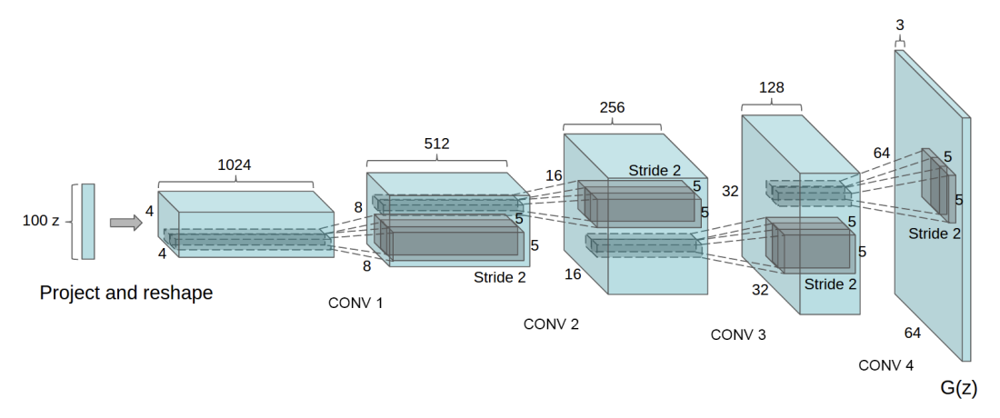

In [176]:
class PaperGenerator(BaseEntity):
    def __init__(self):
        super().__init__()

        self.main = nn.Sequential(
            nn.ConvTranspose2d(100, 1024, kernel_size=4, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(1024),
            nn.ReLU(True),
            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512,  256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256,  128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128,    3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

        super().weights_init()

class PaperDicriminator(BaseEntity):
    def __init__(self):
        super().__init__()

        self.main = nn.Sequential(
            nn.Conv2d(3,   128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512,   1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid(),
        )

        super().weights_init()

### Personal Model

In [177]:
class PersonalGenerator(BaseEntity):
    def __init__(self, latent_vector_size):
        super().__init__()

        self.in_channel = latent_vector_size
        self.out_channel = 32
        self.encoded_image_dim = 10

        cnn_layers = [
            self.in_channel,
            self.out_channel,
            self.out_channel*2,
            self.out_channel*3,
        ]

        ll_size = 256
        self.last_layer_size = cnn_layers[-1]


        self.z_transform = nn.Sequential(
            nn.Flatten(),
            nn.Linear(latent_vector_size, ll_size),
            nn.BatchNorm1d(ll_size),
            nn.LeakyReLU(),
            nn.Linear(ll_size, self.last_layer_size * self.encoded_image_dim ** 2),
        )

        modules = []

        rev_cnn_layers = cnn_layers[::-1][:-1]
        for input, output in zip(rev_cnn_layers, rev_cnn_layers[1:]):
            modules.append(nn.Sequential(
                nn.ConvTranspose2d(input, output, kernel_size=4, stride=1, padding=0),
                nn.BatchNorm2d(output),
                nn.LeakyReLU()
            ))

        modules.append(nn.Sequential( # Last layer
            nn.ConvTranspose2d(cnn_layers[1], 3, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid(),
        ))

        self.main = nn.Sequential(*modules)

        super().weights_init()

    def forward(self, X):
        X = self.z_transform(X)
        X = X.view(-1, self.last_layer_size, self.encoded_image_dim, self.encoded_image_dim)
        return self.main(X)

class PersonalDiscriminator(BaseEntity):
    def __init__(self):
        super().__init__()

        self.main = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=5, stride=1, padding=0),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 16, kernel_size=5, stride=2, padding=0),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 8, kernel_size=5, stride=2, padding=0),
            nn.LeakyReLU(0.2),
            nn.Conv2d(8, 1, kernel_size=4, stride=2, padding=0),
            nn.LeakyReLU(0.2),
            nn.Sigmoid(),
        )

        super().weights_init()


In [161]:
test_g = PersonalGenerator(latent_vector_size).to(device)
test_d = PersonalDiscriminator().to(device)

summary(test_g, (100, 1, 1))
summary(test_d, (3, 32, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 100]               0
            Linear-2                  [-1, 256]          25,856
       BatchNorm1d-3                  [-1, 256]             512
         LeakyReLU-4                  [-1, 256]               0
            Linear-5                 [-1, 9600]       2,467,200
   ConvTranspose2d-6           [-1, 64, 13, 13]          98,368
       BatchNorm2d-7           [-1, 64, 13, 13]             128
         LeakyReLU-8           [-1, 64, 13, 13]               0
   ConvTranspose2d-9           [-1, 32, 16, 16]          32,800
      BatchNorm2d-10           [-1, 32, 16, 16]              64
        LeakyReLU-11           [-1, 32, 16, 16]               0
  ConvTranspose2d-12            [-1, 3, 32, 32]           1,539
          Sigmoid-13            [-1, 3, 32, 32]               0
Total params: 2,626,467
Trainable param

<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [162]:
# Weight init has been moved to the Base class

In [163]:
# model_G = PaperGenerator().to(device)
# # params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
# # # print("Total number of parameters in Generator is: {}".format(params_G))
# # # print(model_G)
# # # print('\n')

# model_D = PaperDicriminator().to(device)
# # params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
# # # print("Total number of parameters in Discriminator is: {}".format(params_D))
# # # print(model_D)
# # # print('\n')

# # # print("Total number of parameters is: {}".format(params_G + params_D))

# summary(model_G, (100, 1, 1))
# summary(model_D, (3, 32, 32))

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [164]:
# Loss is defined in each implementation of GAN for the generator and discriminator

<h3>Choose and initialize optimizers</h3>

In [165]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.

# optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate, betas=(beta1, 0.999))
# optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))


<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [166]:
beta1 = 0.5
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
# Additional input variables should be defined here
real_label = 1
fake_label = 0

#### Training Function

Complete the training loop below. We've defined some variables to keep track of things during training:
* errD: Loss of Discriminator after being trained on real and fake instances
* errG: Loss of Generator
* D_x: Output of Discriminator for real images
* D_G_z1: Output of Discriminator for fake images (When Generator is not being trained)
* D_G_z2: Output of Discriminator for fake images (When Generator is being trained)

In [170]:
def train_models(model_G, model_D, optimizerG, optimizerD, epochs, name):

    total_losses = []

    model_G.train()
    model_D.train()

    # <- You may wish to add logging info here
    for epoch in range(epochs):
        # <- You may wish to add logging info here
        total_lossses_batch = []
        with tqdm.tqdm(loader_train, unit="batch") as tepoch:
            for i, (images, _) in enumerate(tepoch):
                #######################################################################
                #                       ** START OF YOUR CODE **
                #######################################################################
                # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
                model_D.zero_grad()

                real_cpu = images.to(device)
                batch_size = real_cpu.size(0)
                labels = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
                # train with real

                output = model_D(real_cpu).flatten()
                errD_real = model_D.loss(output, labels, save=False)
                errD_real.backward()
                D_x = errD_real.mean().item()

                # train with fake
                noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
                fake = model_G(noise)
                labels.fill_(fake_label)
                output = model_D(fake.detach()).flatten()
                errD_fake = model_D.loss(output, labels, save=False)
                D_x = output.mean().item()

                errD_fake.backward()
                D_G_z1 = output.mean().item()
                optimizerD.step()
                errD = errD_real + errD_fake
                model_D.register_loss(errD)
                # (2) Update G network: maximize log(D(G(z)))

                model_G.zero_grad()
                labels.fill_(real_label)
                output = model_D(fake).flatten()
                errG = model_G.loss(output, labels)
                errG.backward()
                D_G_z2 = output.mean().item()
                optimizerG.step()

                total_lossses_batch.append(errD.item() + errG.item())

                #######################################################################
                #                       ** END OF YOUR CODE **
                #######################################################################
                # Logging
                if i % 50 == 0:
                    tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                    Loss_D=errD.item(), Loss_G=errG.item())

        model_G.end_epoch()
        model_D.end_epoch()
        total_losses.append(torch.tensor(total_lossses_batch).mean())
        if epoch == 0:
            save_image(denorm(real_cpu.cpu()).float(), content_path/f'CW_GAN/{name}_real_samples.png')
        with torch.no_grad():
            fake = model_G(fixed_noise)
            save_image(denorm(fake.cpu()).float(), str(content_path/f'CW_GAN/{name}_fake_samples_epoch_%03d.png') % epoch)

    fig, ax = plt.subplots(figsize=(8, 5))

        # save  models
    # if your discriminator/generator are conditional you'll want to change the inputs here
    torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), content_path/'CW_GAN/GAN_G_f{name}.pth')
    torch.jit.save(torch.jit.trace(model_D, (fake)), content_path/f'CW_GAN/GAN_D_{name}.pth')

    model_G.plot_loss_ax(ax, 'Generator', 'blue')
    model_D.plot_loss_ax(ax, 'Discriminator', 'green')
    ax.plot(total_losses, label='Total Loss', color='red')
    ax.set_xlabel('Epochs')  # Optional: Set X-axis label
    ax.set_ylabel('Loss')
    ax.legend()
    ax.grid(True)
    ax.set_title('Training Losses')
    fig.show()

### Train GAN from paper

In [171]:
model_G = PersonalGenerator(latent_vector_size).to(device)
model_D = PersonalDiscriminator().to(device)

optimizer_G = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))
optimizer_D = torch.optim.Adam(model_D.parameters(), lr=learning_rate, betas=(beta1, 0.999))

train_models(model_G, model_D, optimizer_G, optimizer_D, num_epochs, 'Paper')

  5%|▍         | 19/391 [00:08<02:39,  2.33batch/s, D_G_z=0.496/0.495, D_x=0.496, Loss_D=1.39, Loss_G=0.704]


KeyboardInterrupt: 

## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=18aWqRAnAVTRDY52y1yHSCdqSxUFRKOS9" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1ymO2-jGAvWeUR2kaj_LxQcGYF1RWNRnw" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=13SW62ekW32NMYtfcdm_dCJJ3ZMOZEZAJ" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

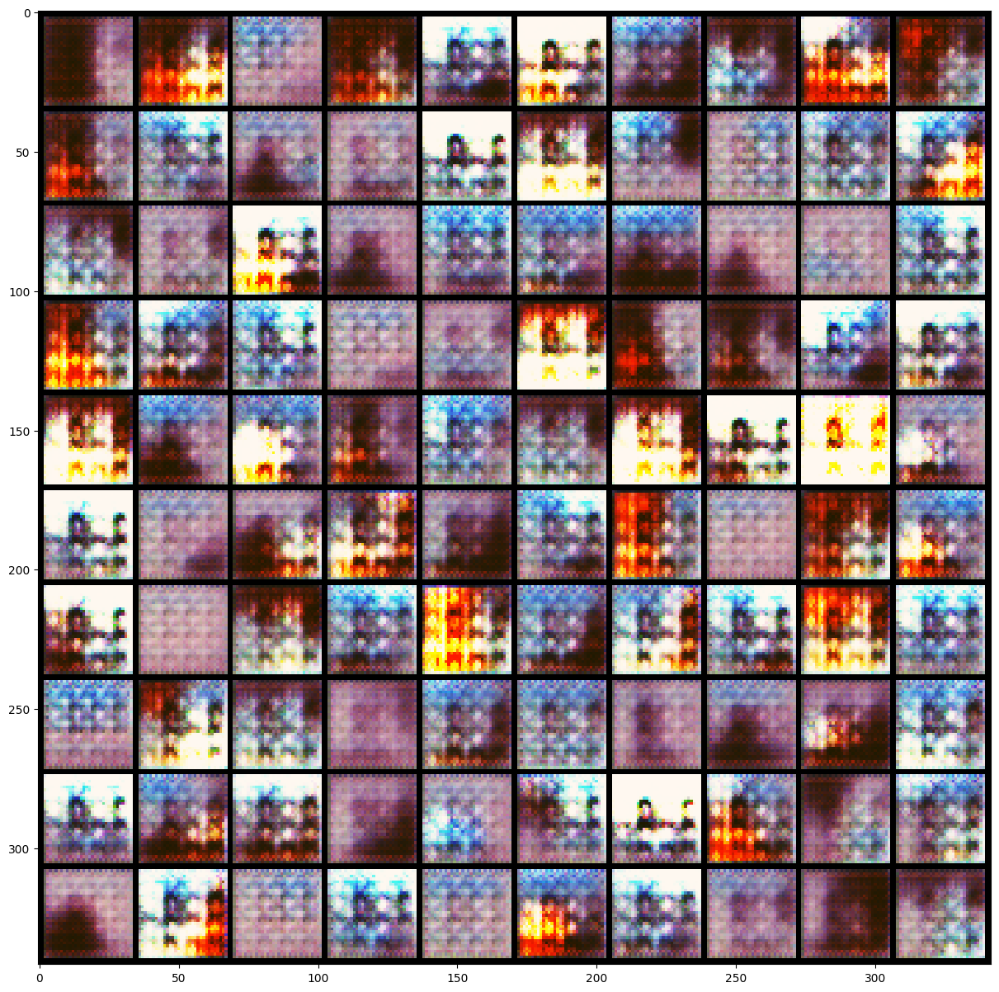

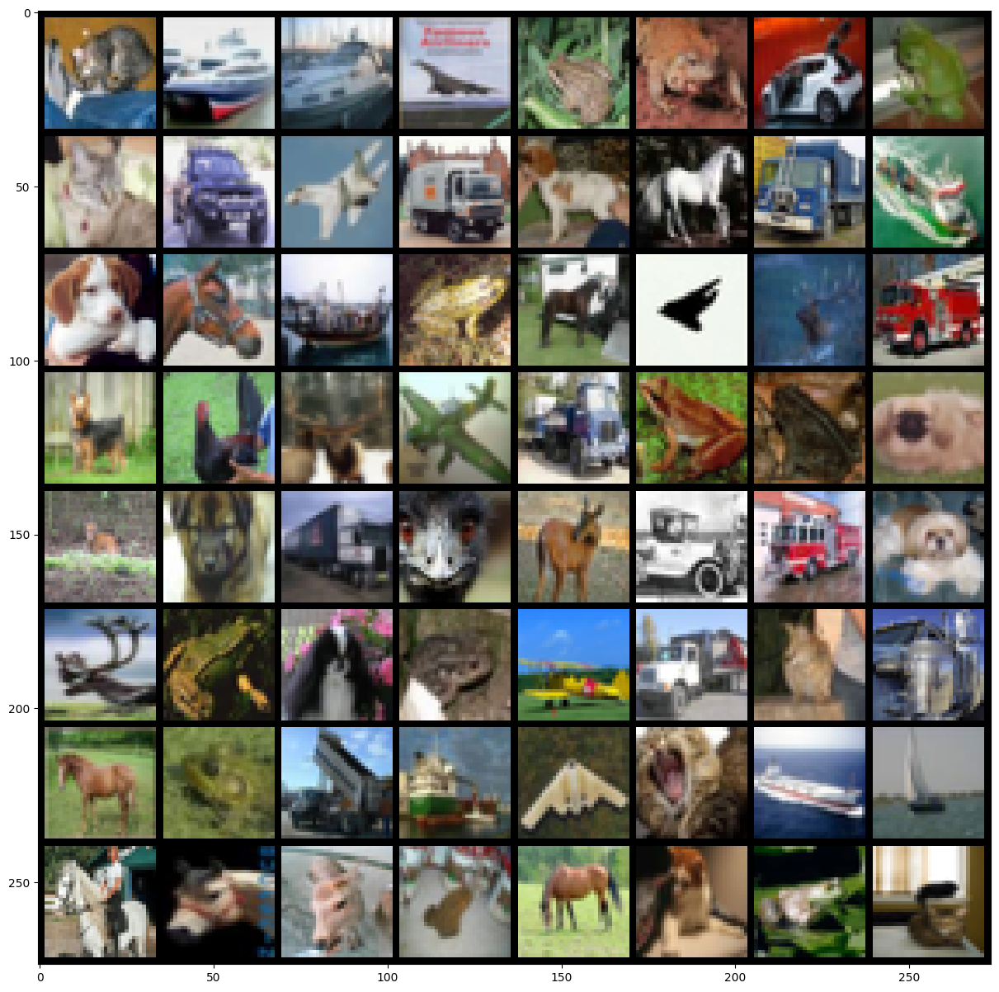

In [85]:
model_G = torch.jit.load(content_path/'CW_GAN/GAN_G_{name}.pth').to(device)

input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=True,
                        value_range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated, content_path/'CW_GAN/Teaching_final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**

## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

In [ ]:
# ANSWER FOR PART 2.2 IN THIS CELL*

### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**

## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:**
 
Describe the what causes the phenomenon of Mode Collapse and how it may manifest in the samples from a GAN. 

Based on the images created by your generator using the `fixed_noise` vector during training, did you notice any mode collapse? what this behaviour may be attributed to, and what did you try to eliminate / reduce it?

In [ ]:
# Any additional code

### Discussion


**YOUR ANSWER**



# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="orange"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [ ]:
# If you want to run these tests yourself, change directory:
# %cd '.../dl_cw2/'
ta_data_path = "../data" # You can change this to = data_path when testing

In [ ]:
!pip install -q torch torchvision

In [ ]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [ ]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

def gan_denorm(x):
    return x

gan_latent_size =

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [ ]:
# Load VAE Dataset
test_dat = datasets.MNIST(ta_data_path, train=False, transform=vae_transform,
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [ ]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

In [ ]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
vae = model_G = torch.jit.load('./CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional
def recurse_cnn_check(parent, flag):
    if flag:
        return flag
    children = list(parent.children())
    if len(children) > 0:
        for child in children:
            flag = flag or recurse_cnn_check(child, flag)
    else:
        params = parent._parameters
        if 'weight' in params.keys():
            flag = params['weight'].ndim == 4
    return flag

has_cnn = recurse_cnn_check(vae, False)
print("Used CNN" if has_cnn else "Didn't Use CNN")

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

In [ ]:
# GAN Tests
model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False,
                    value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)